## Analisi Dati Utenti Firenze-Lastra Seconda Settimana Febbraio 2019

In [1]:
import geopandas as gpd
import fiona as fio
import numpy as np


In [2]:
import warnings
warnings.filterwarnings('ignore')

import skmob
from skmob.preprocessing import filtering
from skmob.preprocessing import compression
import geopandas as gpd
from skmob.utils import plot
import folium
from folium import plugins
import pandas as pd
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
from stats_utils import *
from skmob.utils.plot import *
from skmob.data.load import *

In [3]:
import paramiko

hostname = "kddrtserver10.isti.cnr.it"
username = "avitali"
remote_directory = "/home/avitali"

try:
    ssh = paramiko.SSHClient()
    ssh.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    ssh.connect(hostname, username=username)


    sftp = ssh.open_sftp()

    files = sftp.listdir(remote_directory)
    count=0
    for file in files:
        count+=1
        print(file)
    print (count)

    sftp.close()
    ssh.close()

except Exception as e:
    print(f"An error occurred: {e}")


GPS_20190207_processed.geojson
GPS_processed_1stWeekFeb2019.geojson
.config
Filtered_FI_LASTRA_20190217.geojson
Filtered_LASTRA_GINESTRA_20190214.geojson
Filtered_FI_LASTRA_20190211.geojson
Filtered_LASTRA_GINESTRA_20190215.geojson
Commuters_Febbraio2019.geojson
Filtered_LASTRA_GINESTRA_20190212.geojson
.profile
GPS_20190204_processed.geojson
Filtered_LASTRA_GINESTRA_20190211.geojson
Firenze_Lastra_filtered_2_Settimana_Febbraio_Totale.geojson
Filtered_FI_LASTRA_20190215.geojson
Filtered_FI_LASTRA_20190212.geojson
.ssh
.bashrc
GPS_20190206_processed.geojson
20190211.geojson
.bash_history
.cache
GPS_20190210_processed.geojson
Filtered_LASTRA_GINESTRA_20190217.geojson
Filtered_FI_LASTRA_20190214.geojson
Filtered_LASTRA_GINESTRA_20190213.geojson
GPS_20190205_processed.geojson
Filtered_LASTRA_GINESTRA_20190216.geojson
.bash_logout
.local
Filtered_FI_LASTRA_20190213.geojson
Firenze_Lastra_filtered_2_Settimana_Febbraio.geojson
LASTRA_GINESTRA_filtered_2_Settimana_Febbraio_Totale.geojson
LASTR

#### per leggere file da server (aggiornato)

In [5]:
import paramiko
import geopandas as gpd
import io
from datetime import datetime  

hostname = "kddrtserver10.isti.cnr.it"
username = "avitali"
file = "Firenze_Lastra_filtered_2_Settimana_Febbraio.geojson"

try:
    start_time = datetime.now()
    print(f"Process started at: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")
    #apro connessione ssh
    print("Connecting to SSH server...")
    ssh = paramiko.SSHClient()
    ssh.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    ssh.connect(hostname, username=username)
    print("Connection to SSH server established")

    print("Opening sftp connection...")
    sftp = ssh.open_sftp()
    print("sftp connection opened")

    
    try:
        print(f"Opening file {file}")
        with sftp.open(f"/home/avitali/{file}", "r") as remote_file: #apre il file remoto utilizzando la connessione sftp creata da paramiko
            print(f"Opened remote file: {file}")
            print("Reading file content from remote server...")
            # legge il contenuto
            file_content = remote_file.read() #Legge l'intero contenuto del file remoto in memoria come una stringa binaria.
            print(f"Finished reading file. File size: {len(file_content)} bytes.") 
            
            print("Creating in-memory buffer for the GeoJSON file...")
            #Creazione di un buffer in memoria # in teoria ottimizza lettura perché evita di salvare sul disco
            geojson_buffer = io.BytesIO(file_content) #Trasforma file_content (che è una stringa binaria) in un oggetto simile a un file usando io.BytesIO.
            print("Buffer created successfully. Starting GeoJSON parsing.") #La variabile geojson_buffer diventa un file virtuale in memoria, che può essere utilizzato come un file reale.
            # Con GeoPandas per leggere il contenuto del buffer geojson e trasformarlo in un GeoDataFrame.
            gdf = gpd.read_file(geojson_buffer)
            print(f"Successfully read: {file}")
            print(f"Number of rows: {len(gdf)}")
            print(gdf.head(2))

    except Exception as e:
        print(f"Failed to read {file_path}: {e}")
        
    
    
    finally:
        # chiude SFTP session
        if sftp:
            sftp.close()
            
    end_time = datetime.now()
    print(f"Process completed at: {end_time.strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Total processing time: {end_time - start_time}")    

except Exception as e:
    print(f"An error occurred while connecting to the server: {e}")

finally:
    # chiude SSH connection
    if ssh:
        ssh.close()
        print("Connections closed.")


Process started at: 2025-01-28 11:46:17
Connecting to SSH server...
Connection to SSH server established
Opening sftp connection...
sftp connection opened
Opening file Firenze_Lastra_filtered_2_Settimana_Febbraio.geojson
Opened remote file: Firenze_Lastra_filtered_2_Settimana_Febbraio.geojson
Reading file content from remote server...
Finished reading file. File size: 104009189 bytes.
Creating in-memory buffer for the GeoJSON file...
Buffer created successfully. Starting GeoJSON parsing.
Successfully read: Firenze_Lastra_filtered_2_Settimana_Febbraio.geojson
Number of rows: 319639
  id    ID        Date      Time   Latitude  Longitude  Speed  Heading  \
0  0  2564  2019-02-11  08:38:33  43.805330  11.115726     22      112   
1  1  2564  2019-02-11  08:42:04  43.820942  11.121897     28      298   

   PanelSession  DeltaPos            Timestamp                   geometry  
0             1      2021  2019-02-11T08:38:33  POINT (11.11573 43.80533)  
1             1      2017  2019-02-11

ID_ANONYMOUS,DAY,HH24,LATITUDE,LONGITUDE,SPEED,HEADING,QUALITY,ID_PANELSESSION,DELTAPOS

Ovvero le ultime colonne sono la velocità (km/h, credo) , direzione (gradi, 0 = nord, non mi ricordo se in senso orario), qualità del segnale (è consigliato buttare via quelli < 3), stato del veicolo (0=accensione, 1=in moto, 2=spegnimento), distanza in metri dal punto precedente.

In [8]:
gdf

,id,ID,Date,Time,Latitude,Longitude,Speed,Heading,PanelSession,DeltaPos,Timestamp,geometry
0,0,2564,2019-02-11,08:38:33,43.805330,11.115726,22,112,1,2021,2019-02-11T08:38:33,POINT (11.11573 43.80533)
1,1,2564,2019-02-11,08:42:04,43.820942,11.121897,28,298,1,2017,2019-02-11T08:42:04,POINT (11.12190 43.82094)
2,2,2564,2019-02-11,08:44:50,43.832805,11.111003,52,272,1,2050,2019-02-11T08:44:50,POINT (11.11100 43.83281)
3,3,2564,2019-02-11,08:47:51,43.846563,11.108816,46,300,1,2040,2019-02-11T08:47:51,POINT (11.10882 43.84656)
4,4,2564,2019-02-11,08:50:41,43.863286,11.109768,46,30,1,2054,2019-02-11T08:50:41,POINT (11.10977 43.86329)
...,...,...,...,...,...,...,...,...,...,...,...,...
319634,319634,898351,2019-02-17,05:01:26,43.693571,10.841069,30,338,1,1924,2019-02-17T05:01:26,POINT (10.84107 43.69357)
319635,319635,898351,2019-02-17,05:01:33,43.693571,10.841069,30,338,1,103,2019-02-17T05:01:33,POINT (10.84107 43.69357)
319636,319636,898351,2019-02-17,05:05:09,43.699414,10.833743,72,136,1,2031,2019-02-17T05:05:09,POINT (10.83374 43.69941)
319637,319637,898351,2019-02-17,05:08:39,43.692949,10.849734,70,272,1,2043,2019-02-17T05:08:39,POINT (10.84973 43.69295)


In [11]:
print(gdf.crs)


EPSG:4326


In [8]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 621638 entries, 0 to 621637
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   Date          621638 non-null  object  
 1   DeltaPos      621638 non-null  int64   
 2   Heading       621638 non-null  int64   
 3   ID            621638 non-null  int64   
 4   Latitude      621638 non-null  float64 
 5   Longitude     621638 non-null  float64 
 6   PanelSession  621638 non-null  int64   
 7   Quality       621638 non-null  int64   
 8   Speed         621638 non-null  int64   
 9   Time          621638 non-null  object  
 10  id            621638 non-null  object  
 11  geometry      621638 non-null  geometry
dtypes: float64(2), geometry(1), int64(6), object(3)
memory usage: 56.9+ MB


In [6]:
type(gdf)

geopandas.geodataframe.GeoDataFrame

<Figure size 1500x1500 with 0 Axes>

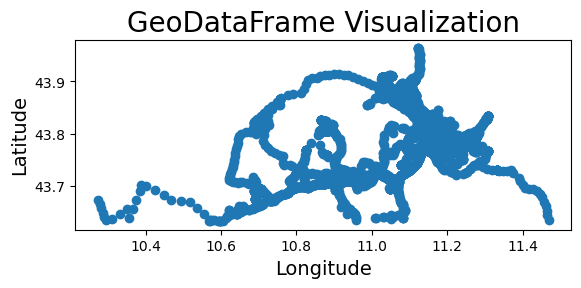

In [8]:
import matplotlib.pyplot as plt


plt.figure(figsize=(15, 15))  
gdf.head(5000).plot()


plt.title("GeoDataFrame Visualization", fontsize=20)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)


plt.show()


## Trasformiamo il gdf in trajectorydf

In [25]:
gdf

,id,ID,Date,Time,Latitude,Longitude,Speed,Heading,PanelSession,DeltaPos,Timestamp,geometry
0,0,2564,2019-02-11,08:38:33,43.805330,11.115726,22,112,1,2021,2019-02-11 08:38:33,POINT (11.11573 43.80533)
1,1,2564,2019-02-11,08:42:04,43.820942,11.121897,28,298,1,2017,2019-02-11 08:42:04,POINT (11.12190 43.82094)
2,2,2564,2019-02-11,08:44:50,43.832805,11.111003,52,272,1,2050,2019-02-11 08:44:50,POINT (11.11100 43.83281)
3,3,2564,2019-02-11,08:47:51,43.846563,11.108816,46,300,1,2040,2019-02-11 08:47:51,POINT (11.10882 43.84656)
4,4,2564,2019-02-11,08:50:41,43.863286,11.109768,46,30,1,2054,2019-02-11 08:50:41,POINT (11.10977 43.86329)
...,...,...,...,...,...,...,...,...,...,...,...,...
319634,319634,898351,2019-02-17,05:01:26,43.693571,10.841069,30,338,1,1924,2019-02-17 05:01:26,POINT (10.84107 43.69357)
319635,319635,898351,2019-02-17,05:01:33,43.693571,10.841069,30,338,1,103,2019-02-17 05:01:33,POINT (10.84107 43.69357)
319636,319636,898351,2019-02-17,05:05:09,43.699414,10.833743,72,136,1,2031,2019-02-17 05:05:09,POINT (10.83374 43.69941)
319637,319637,898351,2019-02-17,05:08:39,43.692949,10.849734,70,272,1,2043,2019-02-17 05:08:39,POINT (10.84973 43.69295)


In [9]:
gdf['Timestamp']=pd.to_datetime(gdf['Timestamp'])

In [10]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 319639 entries, 0 to 319638
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            319639 non-null  object        
 1   ID            319639 non-null  int64         
 2   Date          319639 non-null  object        
 3   Time          319639 non-null  object        
 4   Latitude      319639 non-null  float64       
 5   Longitude     319639 non-null  float64       
 6   Speed         319639 non-null  int64         
 7   Heading       319639 non-null  int64         
 8   PanelSession  319639 non-null  int64         
 9   DeltaPos      319639 non-null  int64         
 10  Timestamp     319639 non-null  datetime64[ns]
 11  geometry      319639 non-null  geometry      
dtypes: datetime64[ns](1), float64(2), geometry(1), int64(5), object(3)
memory usage: 29.3+ MB


In [11]:
from skmob import TrajDataFrame

tdf = TrajDataFrame(gdf, timestamp=True, latitude='Latitude', longitude='Longitude', datetime='Timestamp', user_id='ID')

print("\nTrajDataFrame:")
print(tdf.columns)
print(tdf.head())


TrajDataFrame:
Index(['id', 'uid', 'Date', 'Time', 'lat', 'lng', 'Speed', 'Heading',
       'PanelSession', 'DeltaPos', 'datetime', 'geometry'],
      dtype='object')
  id   uid        Date      Time        lat        lng  Speed  Heading  \
0  0  2564  2019-02-11  08:38:33  43.805330  11.115726     22      112   
1  1  2564  2019-02-11  08:42:04  43.820942  11.121897     28      298   
2  2  2564  2019-02-11  08:44:50  43.832805  11.111003     52      272   
3  3  2564  2019-02-11  08:47:51  43.846563  11.108816     46      300   
4  4  2564  2019-02-11  08:50:41  43.863286  11.109768     46       30   

   PanelSession  DeltaPos            datetime                   geometry  
0             1      2021 2019-02-11 08:38:33  POINT (11.11573 43.80533)  
1             1      2017 2019-02-11 08:42:04  POINT (11.12190 43.82094)  
2             1      2050 2019-02-11 08:44:50  POINT (11.11100 43.83281)  
3             1      2040 2019-02-11 08:47:51  POINT (11.10882 43.84656)  
4           

In [ ]:
tdf = tdf.reset_index(drop=True)

In [12]:
tdf = tdf.sort_values(by=['uid', 'datetime'])
print('\nAnalysis:')
print('records:', len(tdf))
print('unique users:', len(tdf['uid'].unique()))
print('period:', tdf.datetime.min(), '-', tdf.datetime.max())


Analysis:
records: 319639
unique users: 1874
period: 2019-02-11 00:00:16 - 2019-02-17 22:56:51


In [29]:
uid=tdf.groupby('uid').count().sort_values(by=['id'],ascending=False)
uid.head()

,id,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry
uid,,,,,,,,,,,
900229,4187,4187,4187,4187.0,4187.0,4187,4187,4187,4187,1970-01-01 00:00:00.000004187,4187
79204,2190,2190,2190,2190.0,2190.0,2190,2190,2190,2190,1970-01-01 00:00:00.000002190,2190
35675,2118,2118,2118,2118.0,2118.0,2118,2118,2118,2118,1970-01-01 00:00:00.000002118,2118
868989,2026,2026,2026,2026.0,2026.0,2026,2026,2026,2026,1970-01-01 00:00:00.000002026,2026
131334,1894,1894,1894,1894.0,1894.0,1894,1894,1894,1894,1970-01-01 00:00:00.000001894,1894


## Analisi Utenti abitudinari e occasionali 

In [14]:
tdf

,id,uid,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry
41493,41493,996,2019-02-12,08:01:30,44.010111,11.238962,58,140,1,2017,2019-02-12 08:01:30,POINT (11.23896 44.01011)
41494,41494,996,2019-02-12,08:07:37,43.998575,11.240555,0,0,2,1752,2019-02-12 08:07:37,POINT (11.24056 43.99858)
41495,41495,996,2019-02-12,09:00:41,44.005527,11.239921,66,358,1,2058,2019-02-12 09:00:41,POINT (11.23992 44.00553)
41496,41496,996,2019-02-12,09:03:01,44.018283,11.233665,64,6,1,2077,2019-02-12 09:03:01,POINT (11.23367 44.01828)
41497,41497,996,2019-02-12,09:07:54,44.021916,11.234268,0,0,2,452,2019-02-12 09:07:54,POINT (11.23427 44.02192)
...,...,...,...,...,...,...,...,...,...,...,...,...
231212,231212,900983,2019-02-15,16:44:21,43.862533,11.061530,90,300,1,2058,2019-02-15 16:44:21,POINT (11.06153 43.86253)
231213,231213,900983,2019-02-15,16:45:46,43.872532,11.039441,80,310,1,2095,2019-02-15 16:45:46,POINT (11.03944 43.87253)
231214,231214,900983,2019-02-15,16:47:46,43.883328,11.040673,30,102,1,2026,2019-02-15 16:47:46,POINT (11.04067 43.88333)
231215,231215,900983,2019-02-15,16:51:37,43.882777,11.058348,42,36,1,2018,2019-02-15 16:51:37,POINT (11.05835 43.88278)


In [43]:
usage_counts = tdf.groupby('uid')['Date'].nunique().reset_index() 

In [46]:
usage_counts.columns = ['uid', 'days_used']

In [47]:
usage_counts.sort_values(by='days_used',ascending=False).head(10)

,uid,days_used
139,64924,7
1421,681486,7
1587,762764,7
1018,499122,7
1389,668845,7
1231,596836,7
644,310485,7
1125,552944,7
885,443831,7
649,314102,7


In [49]:
usage_counts

,uid,days_used
0,996,1
1,2166,1
2,2564,1
3,3622,2
4,5514,5
...,...,...
1869,898480,6
1870,898528,1
1871,899247,1
1872,900229,6


In [59]:
grouped_counts=usage_counts.groupby('days_used').size().reset_index()

In [61]:
grouped_counts.columns=['days_used','uid']

In [62]:
grouped_counts

,days_used,uid
0,1,1228
1,2,317
2,3,107
3,4,85
4,5,85
5,6,41
6,7,11


In [52]:
import altair as alt
chart = alt.Chart(grouped_counts).mark_bar().encode(
    y=alt.Y('days_used:N', title='Days used'),  
    x=alt.X('uid:Q'), 
    color=alt.Color('uid:Q', scale=alt.Scale(scheme='reds'), title="Number of individual user"),
    tooltip=[alt.Tooltip('uid:Q', title='Number of Users')]  
).properties(
    width=500,   
    height=300,
    title="Frequency of use of the section Firenze-Lastra "
)
chart.save('Frequency of use of the section Firenze-Lastra.html')
chart.show()

alt.Chart(...)

In [23]:
pie_chart = alt.Chart(grouped_counts).mark_arc().encode(
    theta='uid:Q',
    color='days_used:N',
    tooltip=[
        alt.Tooltip('days_used:N', title='Days Used'),
        alt.Tooltip('uid:Q', title='Number of Users')
    ]
).properties(title="Proportions of Users for the Firenze-Lastra Section")
pie_chart.save('Pie Proportions of Users for the Firenze-Lastra Section.html')
pie_chart

alt.Chart(...)

In [67]:
usage_counts_df = pd.DataFrame(usage_counts)

In [69]:
usage_counts_df

,uid,days_used
0,996,1
1,2166,1
2,2564,1
3,3622,2
4,5514,5
...,...,...
1869,898480,6
1870,898528,1
1871,899247,1
1872,900229,6


In [71]:
usage_dict = {}

for num_days in usage_counts_df['days_used'].unique():
    users_with_num_days = usage_counts_df[usage_counts_df['days_used'] == num_days]
    usage_dict[num_days] = {}
    for uid in users_with_num_days['uid']:
        user_data = tdf[tdf['uid'] == uid]
        unique_dates = user_data['Date'].unique()
        usage_dict[num_days][uid] = list(unique_dates)

In [72]:
print(usage_dict[7]) 

{35675: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 64924: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 310485: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 314102: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 443831: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 499122: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 552944: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 596836: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 668845: ['2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17'], 681486: ['2019-02-11', '2019-

In [75]:
gruppo=input('Choose group:')
gruppo = int(gruppo)
rows=[]
for uid, dates in usage_dict[gruppo].items():
    for date in dates:
     rows.append({"uid": uid, "date": date})
dynamic_name = f"group_{gruppo}"
globals()[dynamic_name] = pd.DataFrame(rows)

Choose group: 5


In [74]:
import altair as alt


date_counts = group_1.groupby('date').size().reset_index(name='count')


chart = alt.Chart(date_counts).mark_bar(size=70).encode(
    x=alt.X('date:T', title='Date', timeUnit='yearmonthdate'),  
    y=alt.Y('count:Q', title='Number of Users'),
    tooltip=[
        alt.Tooltip('date:T', title='Date'),  
        alt.Tooltip('count:Q', title='Number of Users')
    ]
).properties(
    title="Distribution of Dates for Group 1",
    width=600,
    height=300
)
chart.save('Group5Usage.html')
chart.show()


alt.Chart(...)

In [77]:
import altair as alt


date_counts = group_5.groupby('date').size().reset_index(name='count')


chart = alt.Chart(date_counts).mark_bar(size=70).encode(
    x=alt.X('date:T', title='Date', timeUnit='yearmonthdate'),  
    y=alt.Y('count:Q', title='Number of Users'),
    tooltip=[
        alt.Tooltip('date:T', title='Date'),  
        alt.Tooltip('count:Q', title='Number of Users')
    ]
).properties(
    title="Distribution of Dates for Group 5",
    width=600,
    height=300
)
chart.save('Group5Usage.html')
chart.show()


alt.Chart(...)

In [78]:
gruppo = int(input("Choose group between 1 and 7: "))

users=[]
for uid, dates in usage_dict[gruppo].items():
    users.append(uid)
    
dynamic_name = f"users_group_{gruppo}"
globals()[dynamic_name] = users 
print(f"users in group {gruppo}: {users}")
print(f"number of users in {gruppo}: {len(users)}")

Choose group between 1 and 7:  5


users in group 5: [5514, 16537, 37225, 37946, 59890, 62722, 69887, 89001, 89909, 89955, 120617, 122711, 134643, 136295, 167834, 176568, 186115, 188859, 189479, 194213, 210454, 223993, 240986, 241704, 245930, 248532, 253545, 259780, 261668, 264081, 269269, 270033, 272297, 277078, 289947, 294628, 304492, 307037, 321892, 324242, 352469, 354872, 355051, 355260, 361991, 366949, 381908, 424643, 427067, 431414, 445765, 454597, 480157, 484424, 502875, 515060, 521426, 556920, 569861, 569958, 570789, 575474, 584136, 624436, 633673, 642671, 671585, 694607, 702805, 719688, 742889, 750084, 752564, 764720, 824618, 827335, 830176, 846562, 850911, 852577, 857379, 865983, 876930, 891366, 894684]
number of users in 5: 85


In [113]:
tdf_group_5=tdf[(tdf['uid'].isin(users_group_5)) ]

In [114]:
weekdays=['2019-02-11','2019-02-12','2019-02-13','2019-02-14','2019-02-15']
weekend=['2019-02-16','2019-02-17']
weekdays_data = tdf_group_5[tdf_group_5['Date'].isin(weekdays)]
weekend_data = tdf_group_5[tdf_group_5['Date'].isin(weekend)] 

In [115]:
overlapping_uids = set(weekdays_data['uid']).intersection(set(weekend_data['uid']))

In [118]:
len(overlapping_uids) 

38

In [98]:
commuters= tdf_group_5[~tdf_group_5['uid'].isin(overlapping_uids)]

In [119]:
commuters['uid'].nunique()

47

In [100]:
commuters['uid'].unique()

array([  5514,  89001,  89909, 120617, 122711, 134643, 136295, 167834,
       186115, 188859, 194213, 241704, 253545, 259780, 261668, 269269,
       270033, 272297, 289947, 304492, 324242, 352469, 354872, 355260,
       361991, 424643, 445765, 484424, 502875, 515060, 521426, 556920,
       569861, 569958, 570789, 584136, 642671, 694607, 702805, 742889,
       764720, 830176, 850911, 865983, 876930, 891366])

## Traiettorie dei gruppi

In [309]:
tdf_group_7=f_tdf[f_tdf['uid'].isin(users_group_7)]

In [ ]:
map_f = tdf_group_7.plot_trajectory(zoom=13, max_users=2000, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

In [311]:
tdf_group_5=f_tdf[f_tdf['uid'].isin(users_group_5)]

In [ ]:
map_f = tdf_group_5.plot_trajectory(zoom=13, max_users=2000, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

In [313]:
weekdays=['2019-02-11','2019-02-12','2019-02-13','2019-02-14','2019-02-15']

In [314]:
tdf_group_5=f_tdf[(f_tdf['uid'].isin(users_group_5)) & (f_tdf['Date'].isin(weekdays)) ]

In [ ]:
map_f = tdf_group_5.plot_trajectory(zoom=13, max_users=2000, start_end_markers=False) 
map_f

In [ ]:
tdf_group_5['uid']

## Filtriamo le traiettorie
Qui facciamo un filtro delle traiettorie togliendo quelle che sono chiaramente errori del GPS. 
Filtriamo i valori con velocità superiori a 180km/h

In [108]:
%%time
f_tdf = filtering.filter(tdf, max_speed_kmh=50.0)
print('Number of records:\t%s'%len(f_tdf))
print('Filtered points:\t%s'%(len(tdf) - len(f_tdf)))

Number of records:	158905
Filtered points:	160734
CPU times: user 7.72 s, sys: 68 ms, total: 7.79 s
Wall time: 7.79 s


In [ ]:
map_f = f_tdf.plot_trajectory(zoom=13, max_users=100, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

## Comprimiamo le traiettorie

Con questo passaggio cerchiamo di alleggerire in dataset senza perdere troppa granularità. Comprimiamo i punti delle traiettorie che sono entro un raggio di 100 metri in un punto solo. 

In [142]:
%%time
fc_tdf = compression.compress(f_tdf, spatial_radius_km=0.1)
print('Points of the filtered trajectory:\t%s'%len(f_tdf))
print('Points of the compressed trajectory:\t%s'%len(fc_tdf))
print('Compressed points:\t\t\t%s'%(len(f_tdf)-len(fc_tdf)))

Points of the filtered trajectory:	319438
Points of the compressed trajectory:	258799
Compressed points:			60639
CPU times: user 32.2 s, sys: 293 ms, total: 32.5 s
Wall time: 32.6 s


più di 60000 punti sono stati compressi.

In [ ]:
map_f = fc_tdf.plot_trajectory(zoom=13, max_users=2000, start_end_markers=False) #visualizza le traiettorie dei 50 utenti
map_f

## Stops detection

Stops detection.

Detect the stay locations (or stops) for each individual in a TrajDataFrame. A stop is detected when the individual spends at least minutes_for_a_stop minutes within a distance stop_radius_factor * spatial_radius km from a given trajectory point. The stop’s coordinates are the median latitude and longitude values of the points found within the specified distance 

In [ ]:
from skmob.preprocessing import detection

In [149]:
 stays= skmob.preprocessing.detection.stay_locations(
     fc_tdf, stop_radius_factor=0.5, minutes_for_a_stop=20.0, spatial_radius_km=0.3)

In [151]:
fc_tdf.head(1)

,id,uid,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry
0,41493,996,2019-02-12,08:01:30,44.010111,11.238962,58,140,1,2017,2019-02-12 08:01:30,POINT (11.238962 44.010111)


In [ ]:
import folium

map_f = folium.Map(location=[43.7696, 11.2558], zoom_start=9, tiles='cartodbpositron')

for index, row in stays.iterrows():
    folium.Circle(
        radius=100,
        location=[row['lat'], row['lng']],
        color="crimson",
        fill=True,
        opacity=0.5,
        popup=f"date: {row['datetime']}"
    ).add_to(map_f)

map_f

## Flussi

In [12]:
import skmob
from skmob.utils.plot import plot_gdf
from skmob.tessellation.tilers import tiler

In [7]:
tessellation = gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson") 

In [13]:
toscana_tess_squared = tiler.get('squared', base_shape=tessellation, meters=500)
print("tiles = %s" %len(toscana_tess_squared))
toscana_tess_squared.head()

tiles = 176976


,tile_ID,geometry
0,0,"POLYGON ((9.68670 44.36531, 9.68670 44.36852, ..."
1,1,"POLYGON ((9.69119 44.36210, 9.69119 44.36531, ..."
2,2,"POLYGON ((9.69119 44.36531, 9.69119 44.36852, ..."
3,3,"POLYGON ((9.69119 44.36852, 9.69119 44.37173, ..."
4,4,"POLYGON ((9.69568 44.36210, 9.69568 44.36531, ..."


In [204]:
plot_gdf(toscana_tess_squared)

KeyboardInterrupt: 

In [14]:
toscana_tess_squared.head(1)

,tile_ID,geometry
0,0,"POLYGON ((9.68670 44.36531, 9.68670 44.36852, ..."


In [ ]:
toscana_tess_squared

In [15]:
fdf=tdf.to_flowdataframe(toscana_tess_squared)
fdf.head()
attribution = 'Map data © <a href="https://www.openstreetmap.org/copyright">OpenStreetMap contributors</a>'

In [ ]:
def style_function(feature):
    return {
        'fillColor': 'green',  
        'color': 'green',       
        'weight': 1,           
        'fillOpacity': 0.0 
    }

map_f = folium.Map(location=[tessellation.geometry.centroid.y.mean(), tessellation.geometry.centroid.x.mean()], zoom_start=9,tiles='cartodbpositron')
popup_features = ['Nome_Comune']
folium.GeoJson(
    tessellation,
    tooltip=folium.GeoJsonTooltip(fields=popup_features),
    style_function= style_function
).add_to(map_f)
map_f

In [ ]:
fdf.plot_flows(map_f=map_f, min_flow=20, flow_weight=3, zoom=18, radius_origin_point=3)

In [21]:
fdf.plot_flows(map_f=map_f, min_flow=5, flow_weight=1, zoom=15, radius_origin_point=0, opacity=0.2)

## Analisi di Misure individuali

In [22]:
from skmob.measures.individual import jump_lengths

jl_list = jump_lengths(tdf, merge=True)

100%|██████████| 1874/1874 [00:03<00:00, 473.08it/s]


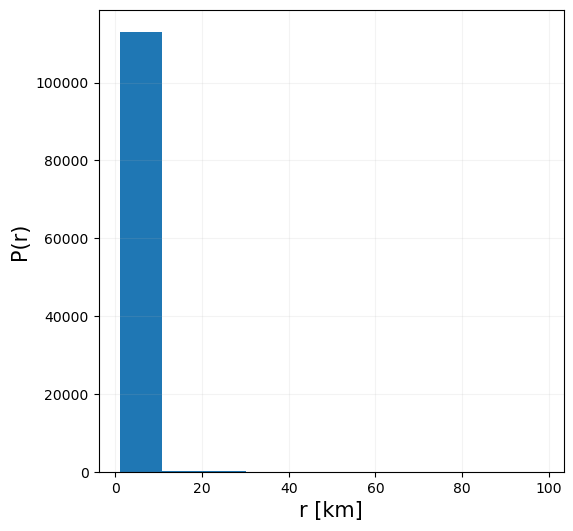

In [23]:

fig = plt.figure(figsize=(6, 6))
d_list = [dist for dist in jl_list if dist >= 1]
plt.hist(d_list)
plt.xlabel('r [km]', fontsize=15)
plt.ylabel('P(r)', fontsize=15)
plt.grid(alpha=0.15)
plt.show()

In [28]:
from skmob.measures.individual import maximum_distance

In [29]:
md_df = maximum_distance(tdf)
md_df.head()


100%|██████████| 1874/1874 [00:03<00:00, 563.11it/s]


,uid,maximum_distance
0,996,54.118391
1,2166,2.234582
2,2564,2.626415
3,3622,2.672783
4,5514,5.210981


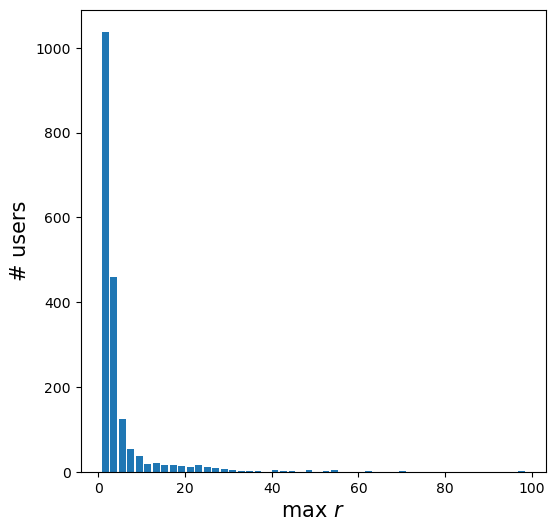

In [30]:

fig = plt.figure(figsize=(6, 6))
plt.hist(md_df['maximum_distance'], bins=50, rwidth=0.8)
plt.xlabel('max $r$', fontsize=15)
plt.ylabel('# users', fontsize=15)
plt.show()

In [31]:
md_df = md_df[md_df['maximum_distance'] > 1]

In [32]:
x, y = zip(*lbpdf(1.5, list(md_df['maximum_distance'])))

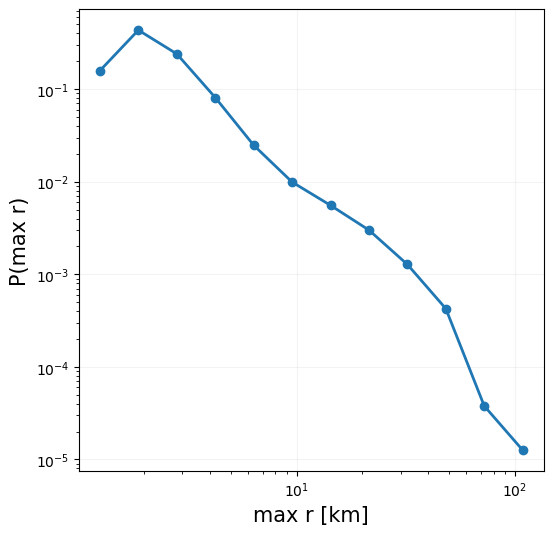

In [33]:
# Anche qui plottiamo usando un binning logaritmico. 
fig = plt.figure(figsize=(6, 6))
plt.plot(x, y, marker='o', linewidth=2)
plt.loglog()
plt.xlabel('max r [km]', fontsize=15)
plt.ylabel('P(max r)', fontsize=15)
plt.grid(alpha=0.15)
plt.show()


### Distanza totale percorsa in linea d'aria
Con la funzione *distance_straight_line* calcoliamo la distanza totale percorsa da ogni individuo usando una straight line(in linea d'aria) per evitare troppo calcolo computazionale.

In [34]:
from skmob.measures.individual import distance_straight_line

In [35]:
dsl_df = distance_straight_line(tdf)
dsl_df.head()

100%|██████████| 1874/1874 [00:03<00:00, 587.82it/s]


,uid,distance_straight_line
0,996,211.100075
1,2166,121.171581
2,2564,39.850496
3,3622,182.694307
4,5514,272.370058


Vediamo quali sono i 10 utenti che hanno percorso la distanza maggiore

In [36]:

ranked_df = dsl_df.sort_values(by='distance_straight_line', ascending=False).reset_index(drop=True)
ranked_df[:10]

,uid,distance_straight_line
0,855212,859.947148
1,900229,855.285364
2,277104,848.909510
3,79204,840.006280
4,414532,810.669013
5,671585,801.487236
6,496445,758.472585
7,868989,750.961739
8,134643,746.261231
9,35675,740.053382


Anche in questo caso, senza sorprese abbiamo la maggior parte degli individui che percorrono distanze relativamente brevi

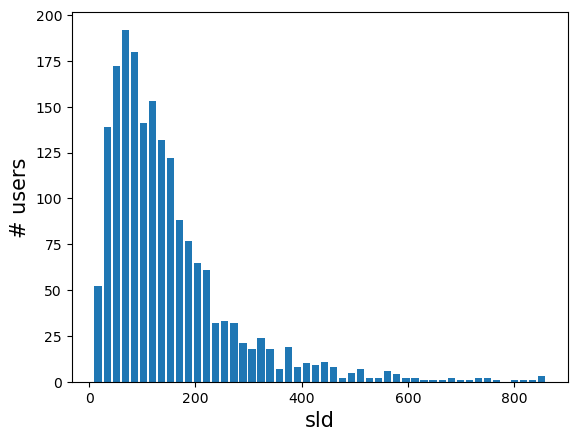

In [37]:
fig = plt.figure()
plt.hist(dsl_df['distance_straight_line'], bins=50, rwidth=0.8)
plt.xlabel('sld', fontsize=15)
plt.ylabel('# users', fontsize=15)
plt.show()

In [38]:
dsl_df = dsl_df[dsl_df['distance_straight_line'] > 1]

Facciamo ancora il binning logaritmico

In [39]:
x, y = zip(*lbpdf(1.5, list(dsl_df['distance_straight_line'])))

se plottiamo e vediamo una distribuione che tende a premiare un andamento simil powerlaw.

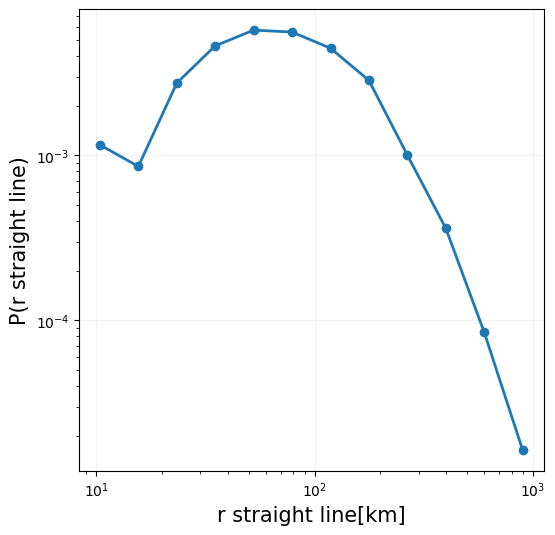

In [40]:

fig = plt.figure(figsize=(6, 6))
plt.plot(x, y, marker='o', linewidth=2)
plt.loglog()
plt.xlabel('r straight line[km]', fontsize=15)
plt.ylabel('P(r straight line)', fontsize=15)
plt.grid(alpha=0.15)
plt.show()

### Distanza massima percorsa da casa
Tramite dati di mobilità possiamo inferire dove vive un utente, per esempio vedendo le fermate notturne o facendo clustering. Con il modulo *max_distance_from_home* prima inferisce la Home location dell'utente e poi calcola distanza massima percorsa da casa. Cioè il punto più lontano raggiunto prendendo come riferimento la casa. 

In [41]:
from skmob.measures.individual import max_distance_from_home

In [42]:
mdh_df = max_distance_from_home(tdf) 
mdh_df.head()

100%|██████████| 1874/1874 [00:10<00:00, 171.61it/s]


,uid,max_distance_from_home
0,996,66.867438
1,2166,39.575110
2,2564,12.943570
3,3622,62.534212
4,5514,12.435821


In [45]:
#Vediamo quali sono i 10 utenti che hanno fatto la distanza maggiore da casa
ranked_df = mdh_df.sort_values(by='max_distance_from_home', ascending=False).reset_index(drop=True)
ranked_df[:10]

,uid,max_distance_from_home
0,315602,106.176593
1,651954,102.833486
2,163631,102.086570
3,839041,100.656084
4,282083,98.490077
5,594545,97.603195
6,882073,97.442501
7,537208,97.078314
8,707741,96.891855
9,608603,96.042178


#Plottiamo l'istogramma e vediamo che non segue una powerlaw ma più una distribuzione a campana. Probabilmente questo è dovuto al fatto che le distanze percorse sono relativamente brevi

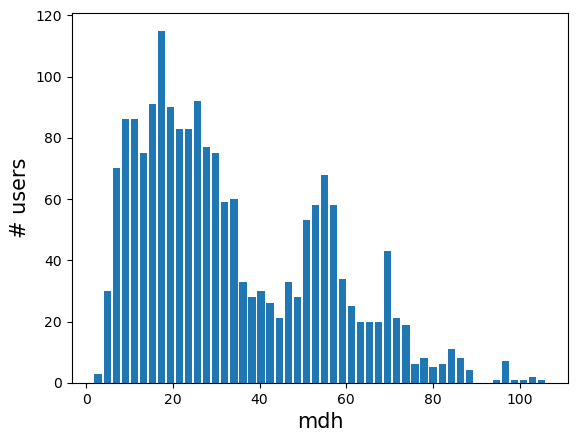

In [46]:


fig = plt.figure()
plt.hist(mdh_df['max_distance_from_home'], bins=50, rwidth=0.8)
plt.xlabel('mdh', fontsize=15)
plt.ylabel('# users', fontsize=15)
plt.show()

In [47]:
mdh_df = mdh_df[mdh_df['max_distance_from_home'] > 1]

In [48]:
x, y = zip(*lbpdf(1.5, list(mdh_df['max_distance_from_home'])))

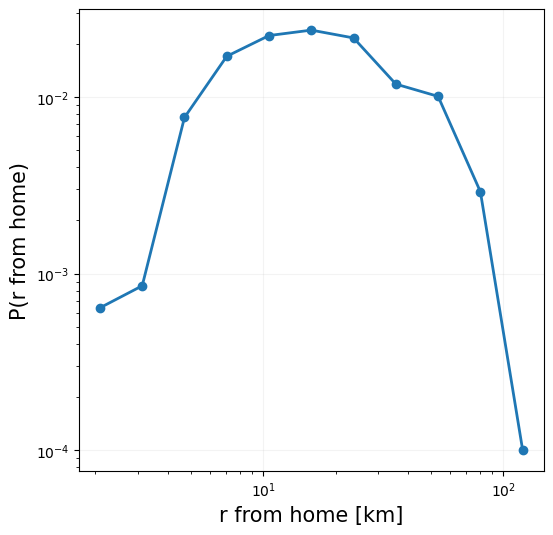

In [49]:
# let's plot the distribution 
fig = plt.figure(figsize=(6, 6))
plt.plot(x, y, marker='o', linewidth=2)
plt.loglog()
plt.xlabel('r from home [km]', fontsize=15)
plt.ylabel('P(r from home)', fontsize=15)
plt.grid(alpha=0.15)
plt.show()

<
### Radius of gyration $r_g$
Distanza caratteristica percorsa da un individuo dove abbiamo un vettore posizione del centro di massa dell'insieme delle posizioni visitate dall'individuo.

In [50]:
from skmob.measures.individual import radius_of_gyration

In [51]:
rg_df = radius_of_gyration(tdf)
rg_df.head()

100%|██████████| 1874/1874 [00:02<00:00, 775.16it/s]


,uid,radius_of_gyration
0,996,25.097033
1,2166,14.819286
2,2564,4.799479
3,3622,20.764252
4,5514,5.468483


Anche in questo caso, come per il max_dist_from_home abbiamo una distribuzione a campana probabilmente dovuta al fatto che le distanze percorse sono relativamente piccole

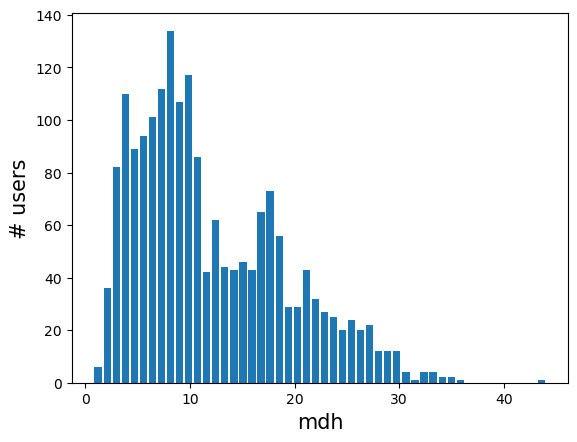

In [52]:

plt.hist(rg_df['radius_of_gyration'], bins=50, rwidth=0.8)
plt.xlabel('mdh', fontsize=15)
plt.ylabel('# users', fontsize=15)
plt.show()

In [53]:
rg_df = rg_df[rg_df['radius_of_gyration'] > 1]

In [54]:
x, y = zip(*lbpdf(1.5, list(rg_df['radius_of_gyration'])))

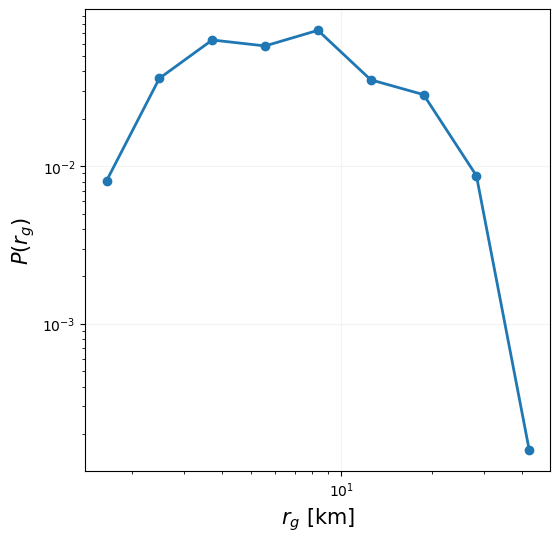

In [55]:
# let's plot the distribution
fig = plt.figure(figsize=(6, 6))
plt.plot(x, y, marker='o', linewidth=2)
plt.loglog()
plt.xlabel('$r_g$ [km]', fontsize=15)
plt.ylabel('$P(r_g)$', fontsize=15)
plt.grid(alpha=0.15)
plt.show()

<a id="krg"></a>
### $k$-radius of gyration $r_g^{(k)}$   
Vediamo una variante del radius_of_gyration chiamata k-radius of gyration che è il radius of gyration applicata la centro di massa  delle k locazioni più visitate dall'utente

In [56]:
from skmob.measures.individual import k_radius_of_gyration

In [57]:
krg_df = k_radius_of_gyration(tdf, k=2)  #impostiamo un k=2

100%|██████████| 1874/1874 [00:09<00:00, 200.60it/s]


In [58]:
krg_df.head()

,uid,2k_radius_of_gyration
0,996,0.644528
1,2166,0.000703
2,2564,0.902605
3,3622,0.000703
4,5514,5.402983


In [59]:
rgs_df = pd.merge(rg_df, krg_df, on='uid')
rgs_df.head()
len(rgs_df)

1873

In [60]:
rgs_df=rgs_df[:5000] #filtriamo i primi 5000 individui per non avere un plot troppo confuso

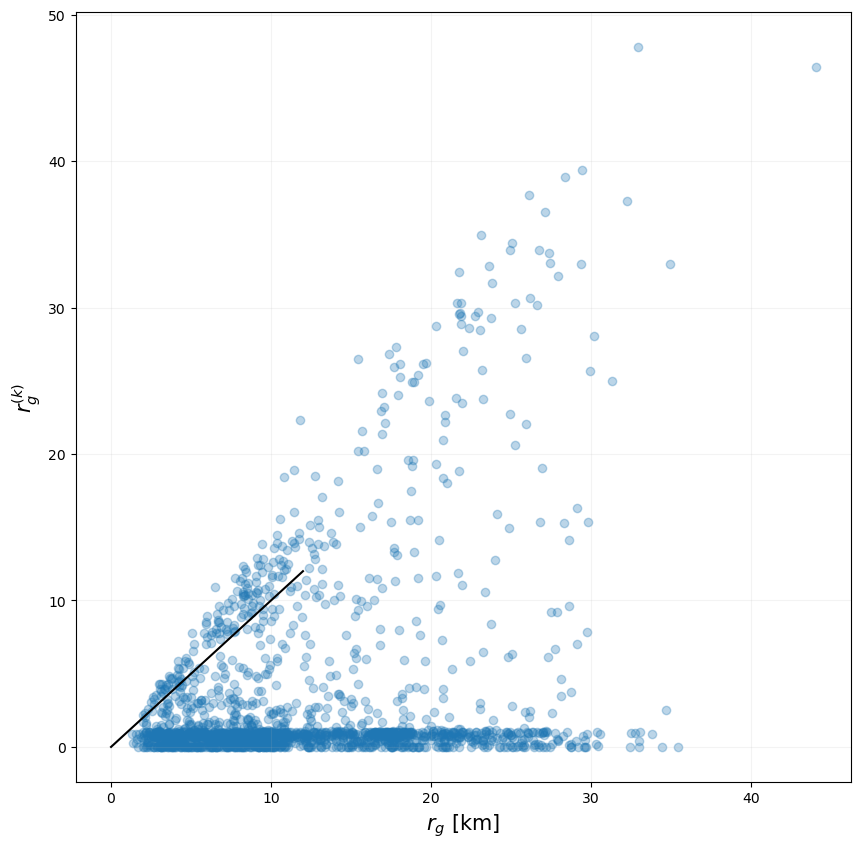

In [61]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(rgs_df['radius_of_gyration'], rgs_df['2k_radius_of_gyration'], marker='o', alpha=0.3)
plt.xlabel('$r_g$ [km]', fontsize=15)
plt.ylabel('$r_g^{(k)}$', fontsize=15)
plt.grid(alpha=0.15)
plt.plot([0, 12], [0, 12], color="black")
plt.show()

### Uncorrelated entropy

Questa misura ci permette di calcolare la predibilità di un individuo nella dimensione spaziale

In [66]:
from skmob.measures.individual import uncorrelated_entropy

In [67]:
s_unc_df = uncorrelated_entropy(tdf, normalize=True)
s_unc_df.head()

100%|██████████| 1874/1874 [00:05<00:00, 350.09it/s]


,uid,norm_uncorrelated_entropy
0,996,1.000000
1,2166,0.998858
2,2564,1.000000
3,3622,0.999087
4,5514,0.997534


An entropy 0 means visits to only one place (one visit or more than one)

In [68]:
s_unc_0 = s_unc_df[s_unc_df['norm_uncorrelated_entropy'] == 0.0]
s_unc_0.head()

,uid,norm_uncorrelated_entropy


In [69]:
s_unc_0_df = pd.merge(tdf, s_unc_0, on='uid')
s_unc_0_df.head()

,id,uid,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry,norm_uncorrelated_entropy


In [70]:
s_unc_0_df = s_unc_0_df.drop_duplicates(subset=['datetime'])
s_unc_0_df

,id,uid,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry,norm_uncorrelated_entropy


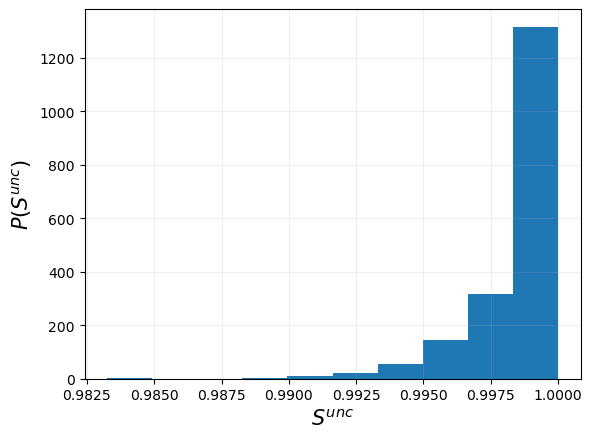

In [71]:
plt.hist(s_unc_df['norm_uncorrelated_entropy'])
plt.xlabel('$S^{unc}$', fontsize=15)
plt.ylabel('$P(S^{unc})$', fontsize=15)
plt.grid(alpha=0.2)
plt.show()

Come avevamo visto in precedenza quando abbiamo esaminato la frequenza di visita a una locazione, la maggior parte degli utenti visitano una singola locazione una e una sola volta e quindi risultano con entropia a 1. Un piccolo gruppo di individui invece hanno un entropia a 0 perché hanno visitato un solo posto più di una volta.

### Individual mobility network
In questo network di mobilità individuali, i nodi rappresentano le località visitate dagli utenti e gli archi diretti i percorsi.

In [72]:
from skmob.measures.individual import individual_mobility_network

In [73]:
imn_df = individual_mobility_network(tdf)
imn_df.head()

100%|██████████| 1874/1874 [00:03<00:00, 469.40it/s]


,uid,lat_origin,lng_origin,lat_dest,lng_dest,n_trips
0,996,44.010111,11.238962,43.998575,11.240555,1
1,996,43.998575,11.240555,44.005527,11.239921,1
2,996,44.005527,11.239921,44.018283,11.233665,1
3,996,44.018283,11.233665,44.021916,11.234268,1
4,996,44.021916,11.234268,44.009819,11.239378,1


In [74]:
type(imn_df)

pandas.core.frame.DataFrame

In [75]:
an_imn = imn_df
an_imn.sort_values(by='n_trips', ascending=False).head()

,uid,lat_origin,lng_origin,lat_dest,lng_dest,n_trips
29007,79204,43.806662,10.867737,43.806663,10.867737,2
46734,138442,43.724457,10.949959,43.724457,10.949960,2
297946,882073,43.699766,10.395734,43.699766,10.395735,2
49766,146223,43.768875,11.132201,43.768876,11.132201,2
64131,183715,43.763766,11.119337,43.763765,11.119337,2


## Misure collettive
sono calcolate sulle traiettorie aggregate di tutti gli individui per quantificare pattern di movimento collettivi

### Case per località

La funzione *homes_per_location* individua le locazioni delle case dei vari individui del dataset

In [90]:
from skmob.measures.collective import homes_per_location

In [91]:
hpl_df = homes_per_location(tdf)


100%|██████████| 1874/1874 [00:04<00:00, 393.58it/s]


In [92]:
hpl_df.head()

,lat,lng,n_homes
0,43.631923,10.559915,1
1,43.766574,11.151959,1
2,43.767031,11.202740,1
3,43.766971,11.251601,1
4,43.766944,11.103725,1


Visualizziamo dove si trovano le homes sulla mappa.

In [93]:
map_f = folium.Map(location=[ 43.7696, 11.2558], zoom_start=9)

In [94]:
for i in range(len(hpl_df)):
    folium.Circle(
    radius=20,
    location=[hpl_df['lat'].iloc[i], hpl_df['lng'].iloc[i]],
    color="crimson",
    fill=True,
    ).add_to(map_f)

In [95]:
map_f

### Visite per unità di tempo

Vediamo l'andamento temporale delle visite aggregate per tutti individui del dataset.
Il plot che è restituito dalla funzione *visits_per_time_unit* con l'unità di tempo impostata a 1 ora, mette in evidenzia alcune tendenze interessanti:
1. I giorni infrasettimanali  hanno un numero maggiore di visite rispetto ai giorni del fine settimana . Questo indica, come ci saremmo aspettati, che durante i giorni lavorativi il traffico stradale è maggiore.
2. Durante le singole giornate, vediamo un crollo del traffico durante le ore notturne e due picchi durante la giornata che potrebbero corrispondere all'ora di punta mattutina e quella del tardo pomeriggio.


In [97]:
from skmob.measures.collective import visits_per_time_unit

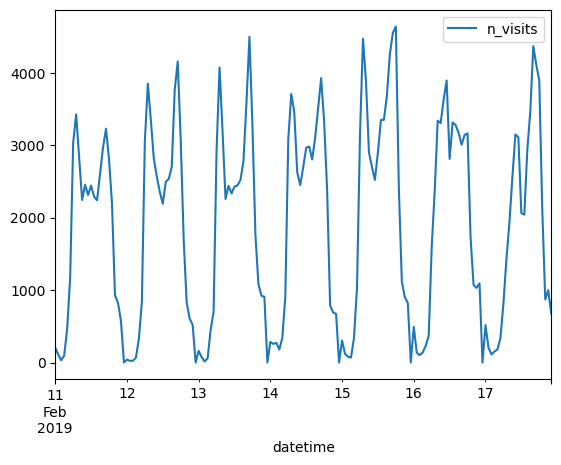

In [98]:
visits_per_time_unit(tdf, time_unit='1h').plot()
plt.show()

## HeatMap



In [99]:
tessellation = gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson") 
tessellation.head(2)

,COD_COMUNE,NO,NAME,Cod_Provincia,Cod_Regione,Nome_Comune,Nome_Provincia,Nome_Regione,geometry
0,45001.0,45001000,Aulla,45.0,9.0,Aulla,Massa-Carrara,Toscana,"POLYGON ((9.97566 44.16410, 9.96647 44.16943, ..."
1,45002.0,45002000,Bagnone,45.0,9.0,Bagnone,Massa-Carrara,Toscana,"POLYGON ((9.99033 44.37321, 10.00467 44.37719,..."


In [101]:
tdf = tdf.sort_values(by=['uid', 'datetime'])


print('\nAnalysis:')
print('records:', len(tdf))
print('unique users:', len(tdf['uid'].unique()))
print('period:', tdf.datetime.min(), '-', tdf.datetime.max())


Analysis:
records: 319639
unique users: 1874
period: 2019-02-11 00:00:16 - 2019-02-17 22:56:51


In [102]:
print(tdf.shape)
tdf.head()

(319639, 12)


,id,uid,Date,Time,lat,lng,Speed,Heading,PanelSession,DeltaPos,datetime,geometry
41493,41493,996,2019-02-12,08:01:30,44.010111,11.238962,58,140,1,2017,2019-02-12 08:01:30,POINT (11.23896 44.01011)
41494,41494,996,2019-02-12,08:07:37,43.998575,11.240555,0,0,2,1752,2019-02-12 08:07:37,POINT (11.24056 43.99858)
41495,41495,996,2019-02-12,09:00:41,44.005527,11.239921,66,358,1,2058,2019-02-12 09:00:41,POINT (11.23992 44.00553)
41496,41496,996,2019-02-12,09:03:01,44.018283,11.233665,64,6,1,2077,2019-02-12 09:03:01,POINT (11.23367 44.01828)
41497,41497,996,2019-02-12,09:07:54,44.021916,11.234268,0,0,2,452,2019-02-12 09:07:54,POINT (11.23427 44.02192)


Facciamo una heatmap delle locazioni segnate dai GPS

In [ ]:
plot_points_heatmap(tdf, map_f=None, max_points=1000, 
                        tiles='cartodbpositron', zoom=10,
                       min_opacity=0.5, radius=25, blur=15,
                       gradient=None)

## Homes_location


In [114]:
import skmob
from skmob.measures.individual import home_location
hl_df = home_location(fc_tdf, start_night='23:00', end_night='6:00')

100%|██████████| 1874/1874 [00:05<00:00, 362.86it/s]


In [115]:
hl_df

,uid,lat,lng
0,996,43.632780,10.598759
1,2166,43.697760,10.834168
2,2564,43.764869,11.177632
3,3622,43.633244,10.567514
4,5514,43.763325,11.277223
...,...,...,...
1869,898480,43.708748,10.932020
1870,898528,43.693236,10.904066
1871,899247,43.709047,10.940241
1872,900229,43.656786,11.303047


In [116]:
import folium

map_f = folium.Map(location=[43.7696, 11.2558], zoom_start=9)

for index, row in hl_df.iterrows():
    folium.Circle(
        radius=20,
        location=[row['lat'], row['lng']],
        color="crimson",
        fill=True,
        popup=f"UID: {row['uid']}"
    ).add_to(map_f)

map_f
